# Анализ базы клиентов ЗАО "Метанпромбанк"

In [1]:
# пожалуйста выполните ячейку для ширины отображения ноутбука на 85% экрана

from IPython.core.display import display, HTML
display(HTML('<style>.container {width:85% !important;}</style>'))

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Нажми, чтобы показать / скрыть код"></form>''')

![image info](https://i.postimg.cc/NMRz47Hc/Metanprom-1.jpg)


### Цель исследования
Анализ клиентской базы банка для выделения основных групп клиентов Метанпромбанка и последующей разработки целевых программ привлечения и повышения лояльности аудитории.    
В ходе исследования мы просегментируем клиентов по принципу `количество потребяемых услуг/доход`, а также составим портреты основных групп пользователей услугами банка.

### Оглавление<a id="0"></a>
- [Подготовка к анализу](#a)    
    - [Настройки проекта](#a0)   
    - [Загрузка данных](#a1)   
    - [Предобработка](#a2)   
    
    
- [Исследовательский анализ](#b)   
    - [Обзор данных](#b1)
    - [Использование продуктов](#b2)
    - [Возраст клиентов](#b3)
    - [Отток](#b4)
    - [Города](#b5) 
    - [Баланс](#b6)
    - [Промежуточные выводы](#b7)
    
        
- [Кластеризация](#c)  
- [Статистический анализ](#d)   
    - [Доход](#d1)   
    - [Возраст](#d2)   
    - [Отток](#d3)   
- [Выводы](#e)   
    - [Доходы](#e1)   
    - [Возраст](#e2)   
    - [Активность](#e3)   
    - [Отток](#e4)   
    - [Город](#e5)   
    - [Баланс](#e6)   
    - [Другие признаки](#e7)   
    - [Модельные группы](#e8)      
- [Рекомендации](#f)    


    
- Дополнительная информация о доходе клиентов и выпуске кредитных карт представлена в [дашборде](https://public.tableau.com/app/profile/evgeniy5413/viz/Methanprom/Dashboard1 "Tableau").     

- Также вся резюмирующая информация по исследованию собрана в [презентации](https://drive.google.com/file/d/1H9LRih6Fz17KinIi4X8vHtXCjqV28Ga0/view?usp=sharing "Презентация").


## Подготовка к работе<a id="a"></a>

### Настройки проекта<a id="a0"></a>
Для удобства работы мы уже настроили ширину отображения Markdown-ячеек в одной из первых строк. Также, выставим другие настройки; установим и импортируем необходимые библиотеки.

In [3]:
# %%capture
# !pip install --upgrade pandas==1.2.4
# !pip install --upgrade seaborn==0.11.1
# !pip install plotly==5.0.0
# !pip install -U missingno

In [4]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale = 1.3, style="darkgrid")

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy import stats
from scipy.stats import shapiro
from scipy.stats import mannwhitneyu


import warnings
warnings.filterwarnings("ignore")
%config Completer.use_jedi = False

custom_seaborn_cmap = [f'rgb{color}' for color in sns.color_palette()]

### Загрузка данных<a id="a1"></a>
Данные о клиентах банка находятся в файле **bank_dataset.csv**, в котором содержатся следующие столбцы:

<table width="80%">
<tr>    
    <th><font size="3">Актуальные названия столбцов</font></th>
    <th><font size="3">Данные</font></th>
    <th><font size="3"><i>Исходные названия столбцов в базе</i></font></th>
</tr>
    
<tr>
<td>
<font size="3">id<br><br>score<br><br>city<br><br>gender<br><br>age<br><br>objects<br><br>balance<br><br>products<br><br>card<br><br>loyalty<br><br>salary<br><br>churn</font>
</td>

<td>
<font size="3">идентификатор пользователя<br><br>
баллы кредитного скоринга<br><br>
город<br><br>
пол<br><br>
возраст<br><br>
количество объектов в собственности<br><br>
баланс на счёте<br><br>
количество продуктов, которыми пользуется клиент<br><br>
есть ли кредитная карта<br><br>
активный клиент<br><br>
заработная плата клиента<br><br>
ушёл или нет</font>
</td>
    
<td>
<font size="3" color="grey"><i>userid<br><br>score<br><br>City<br><br>Gender<br><br>Age<br><br>Objects<br><br>Balance<br><br>Products<br><br>CreditCard<br><br>Loyalty<br><br>estimated_salary<br><br>Churn</i></font>
</td>
    
</tr>
</table>

Получим таблицу и проведём первичный обзор данных.

In [5]:
# сразу назначим столбцам единообразные названия колонок
df = pd.read_csv('https://code.s3.yandex.net/datasets/bank_dataset.csv',
                 names=['id', 'score', 'city', 'gender',
                        'age', 'objects', 'balance', 'products',
                        'card', 'loyalty', 'salary', 'churn'], header=0)

display(df.head(3))

,id,score,city,gender,age,objects,balance,products,card,loyalty,salary,churn
0,15677338,619,Ярославль,Ж,42,2,NaN,1,1,1,101348.88,1
1,15690047,608,Рыбинск,Ж,41,1,83807.86,1,0,1,112542.58,0
2,15662040,502,Ярославль,Ж,42,8,159660.80,3,1,0,113931.57,1


Проверим в каком формате представлены данные и есть ли в таблице пропуски.

In [6]:
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        10000 non-null  int64  
 1   score     10000 non-null  int64  
 2   city      10000 non-null  object 
 3   gender    10000 non-null  object 
 4   age       10000 non-null  int64  
 5   objects   10000 non-null  int64  
 6   balance   6383 non-null   float64
 7   products  10000 non-null  int64  
 8   card      10000 non-null  int64  
 9   loyalty   10000 non-null  int64  
 10  salary    10000 non-null  float64
 11  churn     10000 non-null  int64  
dtypes: float64(2), int64(8), object(2)
memory usage: 937.6+ KB


None

Все числовые данные хранятся в надлежащем (не строковом) формате. Но в колонке 'баланс счёта' много пустых ячеек.

In [7]:
from IPython.display import Markdown as md
md(f'В колонке `balance` <b>{df.balance.isna().sum()}</b> пропущенных значений, что составляет <b>{df.balance.isna().sum() / len(df):.1%}</b> датафрейма.')

В колонке `balance` <b>3617</b> пропущенных значений, что составляет <b>36.2%</b> датафрейма.

Проверим таблицу на наличие дубликатов.

In [8]:
# проверка без столбца 'user_id' на случай присутствия одного клиента с разными id
md(f"Количество дубликатов в датасете: {df.loc[:, 'score' : 'churn'].duplicated().sum()}")

Количество дубликатов в датасете: 0

Дубликатов нет.   
Изучим числовые характеристики датафрейма.

In [9]:
df.describe()

,id,score,age,objects,balance,products,card,loyalty,salary,churn
count,1.000000e+04,10000.000000,10000.000000,10000.000000,6383.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,1.573368e+07,650.528800,38.921800,5.012800,119827.493793,1.530200,0.70550,0.515100,100090.239881,0.203700
std,7.193619e+04,96.653299,10.487806,2.892174,30095.056462,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.560844e+07,350.000000,18.000000,0.000000,3768.690000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,1.567126e+07,584.000000,32.000000,3.000000,100181.975000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,1.573347e+07,652.000000,37.000000,5.000000,119839.690000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,1.579597e+07,718.000000,44.000000,7.000000,139512.290000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,1.585843e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


В нашей подборке имеются клиенты в возрасте от 18 до 92 лет, которые держат на счетах до 250 тысяч, пользуются, максимум 4 продуктами банка. В доходе клиентов указаны суммы от 11 рублей до 200000. Малые суммы объяснимы тем, что кто-то может скрывать реальный доход, а кто-то может его просто не иметь, или действительно иметь минимальный доход - например, только проценты по небольшому вкладу.     


В целом, полученные данные требуют минимальной предварительной подготовки (столбцы уже переименованы, об отсутствующих данных пойдёт речь ниже). Форматы столбцов соответствуют необходимости, дубликатов нет.

### Предобработка<a id="a2"></a>

В вопросе о заполнении пустых ячеек в колонке `balance` будем исходить из того, что это не ключевой признак по которому ведётся анализ. Вместе с тем, заполнение средними, медианными, дисперсными значениями было бы некорректным с учётом того, что отсутствует более *1/3* данных о балансе. Также некорректным было бы присвоение нулевых значений. К сожалению, узнать причину отсутствия значений в условиях отсутствия связи с датаинженером, который осуществлял выгрузку данных, невозможно.    
Одно из предположений касается того, что у пользователей за которыми не числится данных о балансе - его просто нет; они могут не пользоваться дебетовыми счетами и имеют в банке только кредит. Однако и это предположение невозможно проверить.    



Учитывая вышесказанное, считаем нужным оставить данные о балансе как есть, без изменений. Решение о заполнении будет приниматься на отдельных стадиях исследования, по необходимости - если исследование без этого будет невозможным.    

Какой-либо другой предобработки не требуется.    



- [В начало раздела](#a)     
- [К оглавлению](#0)   

## Исследовательский анализ<a id="b"></a>

#### Обзор данных<a id="b1"></a>
Проведём общий обзор признаков, с которыми предстоит работать. Построим графики распределения для всех колонок. 

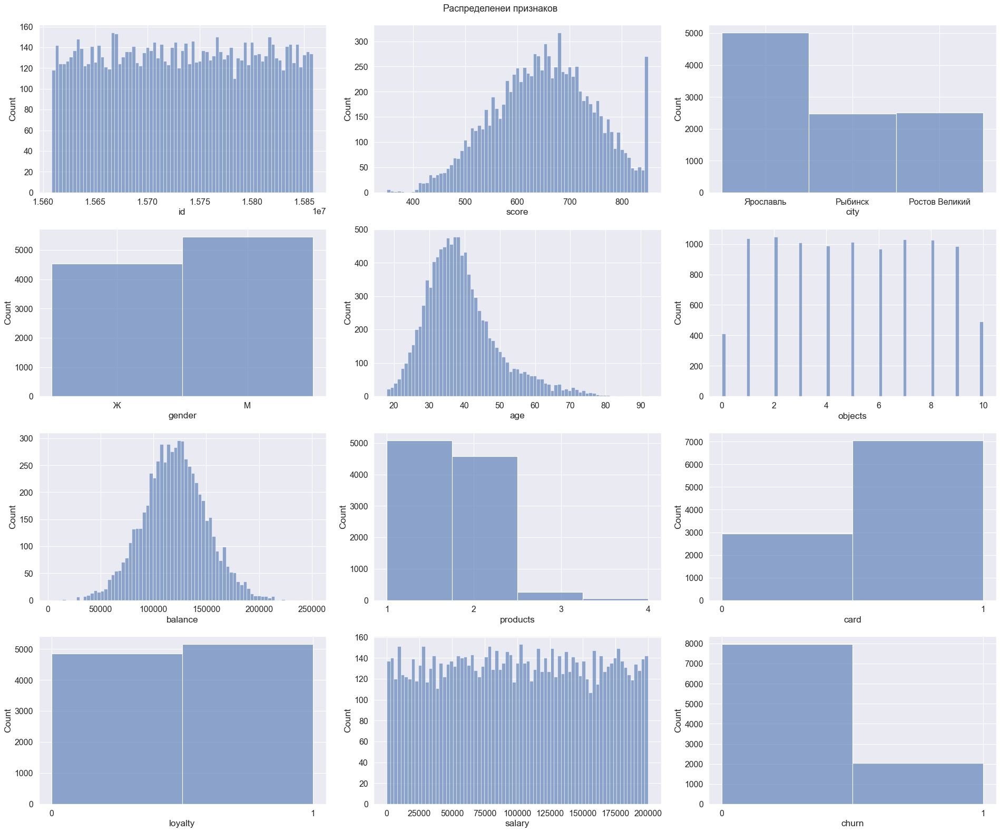

In [10]:
grid = []
for j in range(4):
    for i in range(3):
        grid += [[i, j]]

fig, axes = plt.subplots(4, 3, figsize=(24, 20), dpi=80)

for ax, col in zip(grid, df.columns):        
    if df[col].agg('nunique') < 10:
        x_bins = df[col].agg('nunique')        
    else:
        x_bins = 75

    sns.histplot(ax=axes[ax[1], ax[0]], legend=True,
                 data=df, stat='count', kde=False, x=col, bins=x_bins, palette="tab10", alpha=0.6)

plt.sca(axes[2, 1])
plt.xticks([1, 2, 3, 4])
plt.sca(axes[2, 2])
plt.xticks([0, 1])
plt.sca(axes[3, 0])
plt.xticks([0, 1])
plt.sca(axes[3, 2])
plt.xticks([0, 1])

plt.suptitle('Распределенеи признаков', y=0.99, fontsize = 16)
plt.tight_layout()
plt.show()
plt.close()

Наибольшее внимание обращает на себя график распределения доходов. Он имеет равномерное распределение, что более характерно для случайных величин (таких как, например, броски игральных костей); совокупности зарплат людей, как правило, имеют выраженное среднее, и более редкие около-экстремальные значения. Однако наши клиенты оказались равномерно распределены по разным категориям доходов, что само по себе заслуживает внимания менеджмента.    

Также имеется пик в правой части распределения графика кредитного рейтинга. Не будем считать это выбросом; вероятнее всего, действительно, у части клиентов максимальный кредитный рейтинг. Учитывая, что Метанпромбанк - отраслевая кредитная организация, это могут быть сотрудники банка или предприятий-партнёров, которым, можно сказать, открыт "кредит доверия".   


#### Использование продуктов<a id="b2"></a>
Количество продуктов, которыми пользуются клиенты - ключевая метрика данного исследования. В этом разделе сосредоточимся на ней.    

In [11]:
display(df.groupby('products').agg({'id': 'count'})
        .rename(columns={'id': 'clients'}).style.set_caption('Пользование услугами банка'))

,clients
products,
1,5084
2,4590
3,266
4,60


Так как менеджеры поставили задачу проанализировать метрики тех, кто пользуется одним и двумя продуктами банка, а доля тех, кто пользуется тремя и четырьмя продуктами несравнимо мала, мы будем анализировать только группы с одним и двумя продуктами. Группы, в которых пользуются 3 и 4 продуктами не будем удалять; вместо этого также отнесём их к группе использования 2-х продуктов (будем условно считать, что они пользутся 2 и более продуктами).   
На основании вышеизложенного создадим колонку, в которой **1** - будет значить что клиент использует **один продукт**, а **2** - значит **два и более продуктов**.   


Создадим сводную таблицу со следующей информацией:  



<table width="80%">
<tr>    
    <th><font size="3">названия столбцов</font></th>
    <th><font size="3">содержимое</font></th>
</tr>
    
<tr>
<td>
<font size="3">products_c<br>product_group_count<br>product_group_%<br>age<br>score<br>balance<br>salary<br>churn<br>loyalty<br>card</font>
</td>

<td>
<font size="3">сколько продуктов используют<br>
количество клиентов в группе<br>
доля группы (от общего числа клиентов)<br>
возраст (медиана)<br>
кредитный рейтинг (медиана)<br>
баланс счёта (медиана)<br>
заявленный доход (медиана)<br>
попавшие в отток (доля группы)<br>
активные в последнее время (доля группы)<br>
с кредитной картой (доля группы)</font>
</td>
    
</tr>
</table>


In [12]:
df['products_c'] = 1
df.loc[df['products'] > 1, 'products_c'] = 2

'''Группировка по признаку количество потребляемых продуктов (1 / 2 и более)

    для количественных метрик указаны медианные показатели
    для бинарных - процентное содержание'''
products_c_gr = df.groupby(['products_c']).agg({'id': 'nunique'})
products_c_gr['percentage'] = products_c_gr['id'] / len(df)

products_means = (products_c_gr
                  .merge(df[['age', 'score', 'balance', 'salary', 'products_c']]
                         .groupby('products_c').median(), on='products_c')
                  .merge(df[['churn', 'loyalty', 'card', 'products_c']]
                         .groupby('products_c').mean(), on='products_c')
                  .rename(columns={'id': 'product_group_count', 'percentage': 'product_group_%'}))

display(products_means
        .style
        .format("{:.1%}", subset=['product_group_%', 'churn', 'loyalty', 'card'])
        .format("{:.0f}", subset=['balance', 'salary'])
        .set_caption("Медианные значения для групп потребления"))

,product_group_count,product_group_%,age,score,balance,salary,churn,loyalty,card
products_c,,,,,,,,,
1,5084,50.8%,38,651,119919,99227,27.7%,50.4%,70.4%
2,4916,49.2%,37,652,119762,100862,12.8%,52.6%,70.7%


Как видим, одним и более чем одним продуктом пользуется примерно поровну клиентов. Их средний (медианный) возраст почти одинаковый, абсолютно идентичен кредитный рейтинг и баланс счёта. Немного различается по медиане заявленный уровень доходов, однако говорить о различии на основании только таких наблюдений невозможно. Далее мы проверим различие в доходах в рамках стат-теста.    

Несколько более активны клиенты из группы, пользующейся двумя и более услугами. А самое заметное различие в оттоке. Среди тех, кто пользуется двумя продуктами банка в отток попало значительно меньше клиентов. Эти различия мы также проверим далее с помощью статистических тестов.

Для наглядности ещё раз проиллюстрируем сотношение количества тех кто польуется одним, а также двумя и более продуктами банка. А также построим графики распределения для признаков, с разделением по группам потребления.

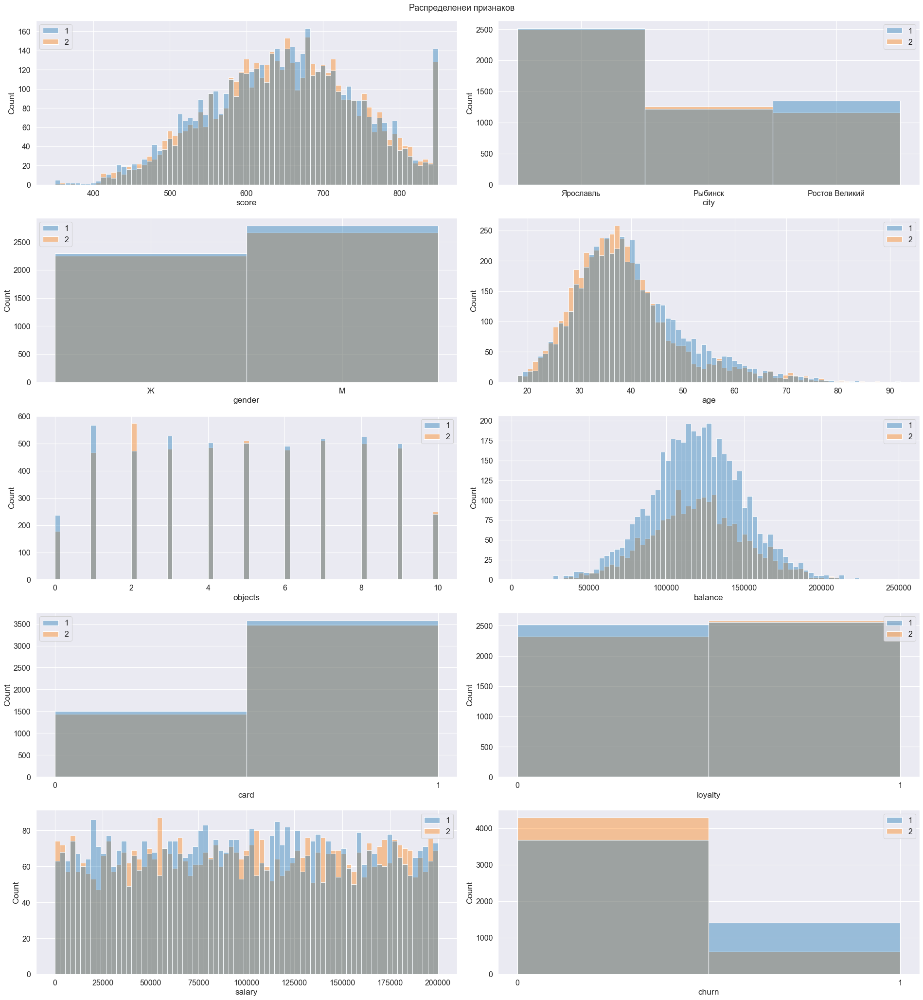

In [13]:
grid = []
for j in range(5):
    for i in range(2):
        grid += [[i, j]]

fig, axes = plt.subplots(5, 2, figsize=(24, 26), dpi=80)

for ax, col in zip(grid, df.drop(['id', 'products', 'products_c'], axis=1).columns):        
    if df[col].agg('nunique') < 10:
        x_bins = df[col].agg('nunique')        
    else:
        x_bins = 75

    sns.histplot(ax=axes[ax[1], ax[0]], legend=True,
                 data=df.drop(['id', 'products', 'products_c'], axis=1), stat='count', kde=False, x=col, hue=df.products_c.tolist(), bins=x_bins, palette="tab10", alpha=0.4)

plt.sca(axes[3, 0])
plt.xticks([0, 1])
plt.sca(axes[3, 1])
plt.xticks([0, 1])
plt.sca(axes[4, 1])
plt.xticks([0, 1])

plt.suptitle('Распределенеи признаков', y=0.99, fontsize = 16)
plt.tight_layout()
plt.show()
plt.close()

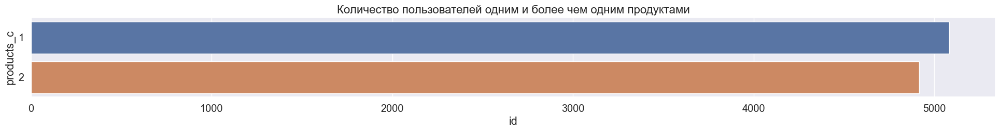

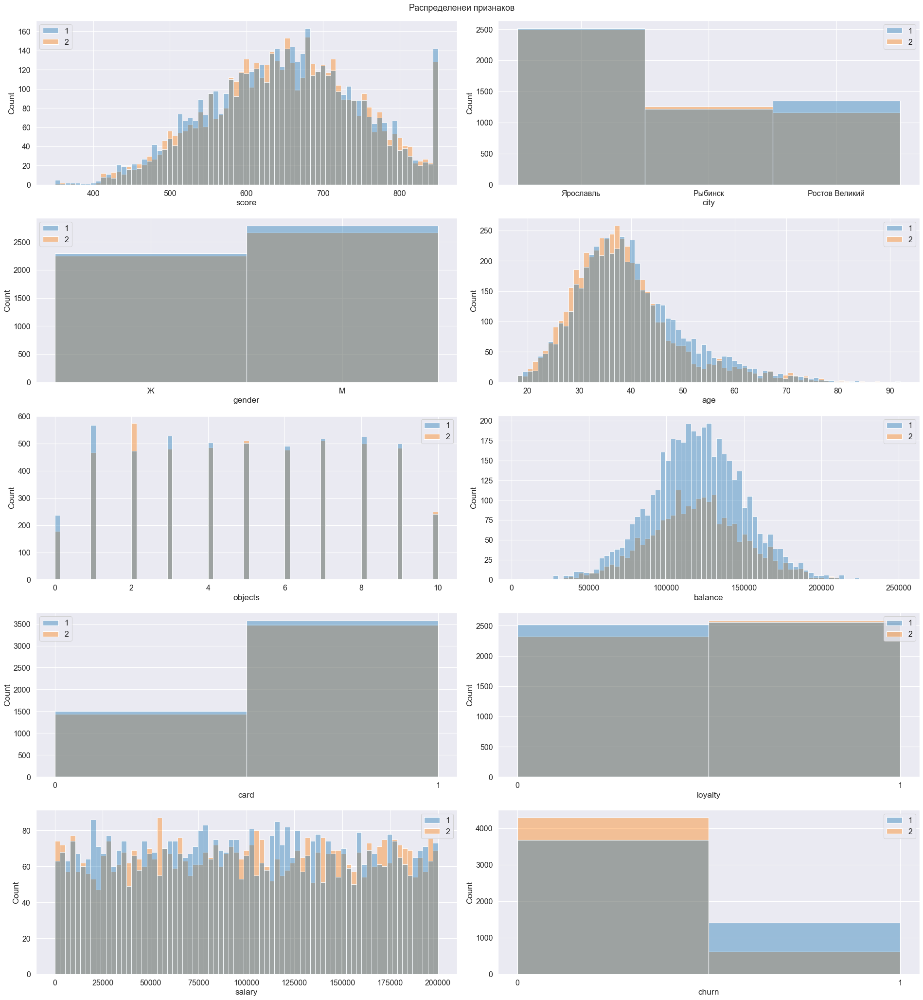

In [14]:
# график соотношения количества тех кто потребляет 1 / 2 и более продуктов
fig, ax = plt.subplots(figsize=(24, 2))

ax = sns.barplot(x="id", y="products_c", orient='h',
                 data=df.groupby(['products_c'], as_index=False).agg({'id': 'nunique'}))

plt.title('Количество пользователей одним и более чем одним продуктами', fontsize = 16)
plt.show()
plt.close()

grid = []
for j in range(5):
    for i in range(2):
        grid += [[i, j]]

fig, axes = plt.subplots(5, 2, figsize=(24, 26), dpi=80)

for ax, col in zip(grid, df.drop(['id', 'products', 'products_c'], axis=1).columns):        
    if df[col].agg('nunique') < 10:
        x_bins = df[col].agg('nunique')        
    else:
        x_bins = 75

    sns.histplot(ax=axes[ax[1], ax[0]], legend=True,
                 data=df.drop(['id', 'products', 'products_c'], axis=1), stat='count', kde=False, x=col, hue=df.products_c.tolist(), bins=x_bins, palette="tab10", alpha=0.4)

plt.sca(axes[3, 0])
plt.xticks([0, 1])
plt.sca(axes[3, 1])
plt.xticks([0, 1])
plt.sca(axes[4, 1])
plt.xticks([0, 1])

plt.suptitle('Распределенеи признаков', y=0.99, fontsize = 16)
plt.tight_layout()
plt.show()
plt.close()

Данные наблюдения также подтвердили более высокую долю пользователей одного продукта среди тех, кто перестал пользоваться услугами банка; в то время как среди тех, кто по-прежнему является клиентом превалируют пользователи двух и более услуг. Также среди тех, кто неактивен как клиент (значение 0 в колонке `loyalty`) превалируют потребители одного продукта.    

Кроме того, внимание на себя обращает то, что в Ростове больше чем в других городах пропорция смещена на сторону тех, кто пользуется лишь одной услугой.   
Также кривые распределения возрастов в обеих категориях (1 и 2+ продуктов) равномерны примерно до 40 лет, однако после этого рубежа с прибавлением возраста - количество тех кто пользуется двумя услугами банка падает быстрее, чем тех, кто пользуется одной.    
Другими словами, клиентов старшего возраста - больше среди потребителей одной услуги.

#### Возраст клиентов<a id="b3"></a>
Для удобства анализа и выявления паттернов создадим отдельные возрастные категории:    
- от 18 до 30 лет (включительно)
- от 31 до 40 лет
- от 41 до 50
- и свыше 50 лет

In [15]:
def age_segmentation(row):
    if row['age'] <= 30: return '18 - 30'
    if row['age'] <= 40: return '31 - 40'
    if row['age'] <= 50: return '41 - 50'
    else: return '50+'

df['age_ctg'] = df.apply(age_segmentation, axis=1)
display(df[['age', 'age_ctg']].head())

,age,age_ctg
0,42,41 - 50
1,41,41 - 50
2,42,41 - 50
3,39,31 - 40
4,43,41 - 50


Посмотрим сколько всего клиентов попало в группы возраст/количество услуг, а также проанализируем медианный доход в этих группах.

In [16]:
plot_01 = (df.groupby(['age_ctg', 'products_c'], as_index=False)
                  .agg({'salary': 'median'})
           .merge(df.groupby(['age_ctg', 'products_c'], as_index=False)
                  .agg({'id': 'nunique'}), on=['age_ctg', 'products_c'])
           .sort_values('age_ctg', ascending=False))

plot_01['salary'] = round(plot_01['salary']).astype('int')

In [17]:
fig = make_subplots(rows=1, cols=2, horizontal_spacing = 0, specs=[[{"secondary_y": True}, {"secondary_y": True}]])

fig.add_trace(go.Bar(y=plot_01.query('products_c == 1')['age_ctg'],
                     x=plot_01.query('products_c == 1')['id'],
                     name='1 poroduct', orientation='h',
                     text=plot_01.query('products_c == 1')['age_ctg'],
                     textposition='auto',
                     insidetextanchor='start', 
                     marker=dict(color=custom_seaborn_cmap[0])                
                    ), row=1, col=1, secondary_y=False)

fig.add_trace(go.Bar(y=plot_01.query('products_c == 2')['age_ctg'],
                     x=plot_01.query('products_c == 2')['id'],
                     name='2+ products', orientation='h',
                     text=plot_01.query('products_c == 2')['age_ctg'],
                     textposition='auto',
                     insidetextanchor='start',
                     marker=dict(color=custom_seaborn_cmap[1])
                    ), row=1, col=1, secondary_y=False)

fig.add_trace(go.Bar(y=plot_01.query('products_c == 1')['age_ctg'],
                     x=plot_01.query('products_c == 1')['salary'],
                     name='1 poroduct', orientation='h',
                     text=plot_01.query('products_c == 1')['salary'],
                     textposition='auto',
                     insidetextanchor='start',
                     showlegend=False,
                     marker=dict(color=custom_seaborn_cmap[0])
                    ), row=1, col=2, secondary_y=True)

fig.add_trace(go.Bar(y=plot_01.query('products_c == 2')['age_ctg'],
                     x=plot_01.query('products_c == 2')['salary'],
                     name='2+ products', orientation='h',
                     text=plot_01.query('products_c == 2')['salary'],
                     textposition='auto',
                     insidetextanchor='start',
                     showlegend=False,
                     marker=dict(color=custom_seaborn_cmap[1])
                    ), row=1, col=2, secondary_y=True)

fig['layout']['xaxis']['autorange'] = "reversed"

fig.update_traces(hovertemplate='<b>%{x}</b> клиентов', row=1, col=1)
fig.update_traces(hovertemplate='Доход: <b>%{x:.0f}</b> (медиан.)', row=1, col=2)

fig.update_xaxes(title='количество клиентов в группах (чел.)', side='top', row=1, col=1)
fig.update_xaxes(title='заявленный доход (по медиане)', side='top', row=1, col=2)

fig.update_layout(height=500,  
                  title={'text': "ВОЗРАСТНЫЕ КАТЕГОРИИ", 'y':0.99, 'x':0.465},
                  font=dict(family="Arial"),
                  template='seaborn',
                  legend=dict(orientation='h', yanchor="bottom", y=-0.04,
                              xanchor="left", x=0.3,
                              title_text='Количество используемых продуктов:'),
                  margin = dict(t=30, l=0, r=0, b=30))
fig.show()

В сегменте от 31 до 40 лет наибольшее количество клиентов. Однако, если до 40 лет число тех, кто пользуется 2+ услугами в среднем выше, то начиная с группы от 40 лет превалируют те, кто пользуется только одной услугой банка.    

Вместе с тем, доход у тех, кто пользуется 2 и более продуктами в среднем выше, чем у тех, кто пользуется одним. За исключением группы 31-40 лет, что объяснимо: в этом возрасте люди чаще приобретают жильё и автомобили, в том числе в кредит. Доход может быть указан уже за вычетом кредитной нагрузки. Ещё одна причина: это активный возраст, когда многие клиенты развивают собственный бизнес, и могут вкладывать в него часть средств, что также снижает доходы. 

#### Отток<a id="b4"></a>
Посмотрим на отток в разрезе групп потребления услуг.

In [18]:
prod_churn_1 = df.groupby(['churn', 'products'], as_index=False).agg({'id': 'count'})
prod_churn_2 = df.groupby('products').agg({'id': 'count'}).merge(prod_churn_1[prod_churn_1['churn'] == 1], on='products')
prod_churn_2['churn_share'] = prod_churn_2['id_y'] / prod_churn_2['id_x']
prod_churn_2.columns = ['количество_услуг', 'всего_пользователей', 'отток_id', 'отток', 'доля_оттока']

display(prod_churn_2[['количество_услуг', 'всего_пользователей', 'доля_оттока']].style.format('{:.1%}', subset='доля_оттока'))

,количество_услуг,всего_пользователей,доля_оттока
0,1,5084,27.7%
1,2,4590,7.6%
2,3,266,82.7%
3,4,60,100.0%


Среди пользователей 4 продуктов ушли абсолютно все. Также высокая доля оттока среди пользователей 3 продуктов. Однако, клиенты, которые пользуются 2 услугами уходят гораздо реже, чем пользователи только одной услуги.    

Не будем забывать, что пользователей, использующих 3 и 4 услуги значительно меньше, чем в других группах.   
Проверим как соотносятся показатели оттока для объединённых групп по 1 и 2+ продуктам.     
Также выясним, как с этими показателями связана лояльность. 

In [19]:
pie_data_churn = (df.groupby(['products_c', 'churn'], as_index=False)
                  .agg({'id': 'count'}).sort_values('products_c', ascending=True))
pie_data_churn.loc[pie_data_churn['churn'] == 1, 'churn_verbose'] = 'ушли'
pie_data_churn.loc[pie_data_churn['churn'] != 1, 'churn_verbose'] = 'остались'
pie_data_churn.loc[pie_data_churn['products_c'] == 1, 'products_c_verbose'] = '1 продукт'
pie_data_churn.loc[pie_data_churn['products_c'] != 1, 'products_c_verbose'] = '2+ продуктов'
pie_data_churn_list = [pie_data_churn.query(f'products_c_verbose == "{pr}"')
                       for pr in pie_data_churn['products_c_verbose'].unique().tolist()]

pie_data_loyalty = (df.groupby(['products_c', 'loyalty'], as_index=False)
                    .agg({'id': 'count'}).sort_values('products_c', ascending=True))
pie_data_loyalty.loc[pie_data_loyalty['loyalty'] == 1, 'loyalty_verbose'] = 'лояльные клиенты'
pie_data_loyalty.loc[pie_data_loyalty['loyalty'] != 1, 'loyalty_verbose'] = 'не лояльны'
pie_data_loyalty.loc[pie_data_loyalty['products_c'] == 1, 'products_c_verbose'] = '1 продукт'
pie_data_loyalty.loc[pie_data_loyalty['products_c'] != 1, 'products_c_verbose'] = '2+ продуктов'
pie_data_loyalty_list = [pie_data_loyalty.query(f'products_c_verbose == "{pr}"')
                         for pr in pie_data_loyalty['products_c_verbose'].unique().tolist()]

In [20]:
fig = go.Figure()

fig.add_trace(go.Pie(labels=pie_data_churn_list[0]['churn_verbose'],
                     values=pie_data_churn_list[0]['id'],
                     name=f"группа<br>{pie_data_churn_list[0]['products_c_verbose'].mode()[0]}",
                     marker_colors=['steelblue', 'lightgray'],
                     text=pie_data_churn_list[0]['products_c_verbose'],
                     hole=0.4,
                     direction ='clockwise',
                     legendgroup='churn', sort=False,
                     domain={'x': [0.1, 0.4], 'y': [0, 1]}))

fig.add_trace(go.Pie(labels=pie_data_churn_list[1]['churn_verbose'],
                     values=pie_data_churn_list[1]['id'],
                     name=f"группа<br>{pie_data_churn_list[1]['products_c_verbose'].mode()[0]}",
                     text=pie_data_churn_list[1]['products_c_verbose'],
                     hole=0.60,
                     direction ='clockwise',
                     showlegend=False, sort=False,
                     domain={'x': [0, 0.5], 'y': [0, 1]}))

fig.add_trace(go.Pie(labels=pie_data_loyalty_list[0]['loyalty_verbose'],
                     values=pie_data_loyalty_list[0]['id'],
                     name=f"группа<br>{pie_data_loyalty_list[0]['products_c_verbose'].mode()[0]}",
                     marker_colors=['lightgray', 'steelblue'],
                     text=pie_data_loyalty_list[0]['products_c_verbose'],
                     hole=0.4,
                     direction ='clockwise',
                     legendgroup='loyalty', sort=False,
                     domain={'x': [0.6, 0.9], 'y': [0, 1]}))

fig.add_trace(go.Pie(labels=pie_data_loyalty_list[1]['loyalty_verbose'],
                     values=pie_data_loyalty_list[1]['id'],
                     name=f"группа<br>{pie_data_loyalty_list[1]['products_c_verbose'].mode()[0]}",
                     text=pie_data_loyalty_list[1]['products_c_verbose'],
                     hole=0.6,
                     direction ='clockwise',
                     showlegend=False, sort=False,
                     domain={'x': [0.5, 1], 'y': [0, 1]}))

fig.update_traces(hoverinfo='label+text+value+percent+name',
                  textposition='inside', marker=dict(line=dict(color='white', width=2.5)))

fig.update_layout(height=700,
                  margin = dict(t=20, l=100, r=100, b=0), 
                 legend=dict(yanchor="top", xanchor="center", y=0.95, x=0.5, orientation='h'),                  
                 annotations=[dict(text='отток', x=0.44, y=0.98, font_size=20, showarrow=False),
                              dict(text='лояльность', x=0.53, y=0.98, font_size=20, showarrow=False)])
fig.show()

Клиенты которые пользуются двумя и более продуктами лишь немного активнее, чем те, кто использует один продукт.    
В метрике оттока разница заметнее. Из группы, которая пользовалась  только одним продуктом банка, более 1/4 клиентов попали в отток. Из тех, кто пользовался 2+ продуктами - только около 13% перестали быть клиентами (*причём значительную часть этого показателя обеспечена оттоков среди потребителей 3 и 4 продуктов. И всё равно метрика оттока ниже, чем в группе по 1 продукту*).

#### Города<a id="b5"></a>
В ходе общего обзора данных также было хорошо заметно, что в Ростове значительный перевес на стороне тех, кто пользуется лишь одним продуктом.

In [21]:
city_grouping = (df.groupby(['city', 'products_c'], as_index=False)
                 .agg({'id': 'count'})
                 .merge(df.groupby(['city'], as_index=False)
                        .agg({'id': 'count'}), on='city'))

city_grouping.columns = ['city', 'products', 'product_users_count', 'city_clients_count']
city_grouping['product_users_percentage'] = (city_grouping['product_users_count']
                                             / city_grouping['city_clients_count'])

In [22]:
fig = make_subplots(rows=1, cols=2, horizontal_spacing = 0.01, specs=[[{"secondary_y": True}, {"secondary_y": True}]])

cities = city_grouping['city'].unique().tolist()

fig.add_trace(go.Bar(x=city_grouping[city_grouping['products'] == 1]['product_users_count'],
                     y=cities,
                     name='1 poroduct', orientation='h',
                     textposition='auto',
                     texttemplate='%{x}',
                     insidetextanchor='end',
                     marker=dict(color=custom_seaborn_cmap[0])                
                    ), row=1, col=1, secondary_y=False)

fig.add_trace(go.Bar(x=city_grouping[city_grouping['products'] == 2]['product_users_count'],
                     y=cities,
                     name='2+ poroducts', orientation='h',
                     textposition='auto',
                     texttemplate='%{x}',
                     insidetextanchor='end', 
                     marker=dict(color=custom_seaborn_cmap[1])                
                    ), row=1, col=1, secondary_y=False)

fig.add_trace(go.Bar(x=city_grouping[city_grouping['products'] == 1]['product_users_percentage'],
                     y=cities,
                     name='1 poroduct', orientation='h',
                     textposition='auto',
                     texttemplate='%{x:.1%}',
                     insidetextanchor='end',
                     showlegend=False,
                     marker=dict(color=custom_seaborn_cmap[0])                
                    ), row=1, col=2, secondary_y=True)

fig.add_trace(go.Bar(x=city_grouping[city_grouping['products'] == 2]['product_users_percentage'],
                     y=cities,
                     name='2+ poroducts',
                     orientation='h',
                     textposition='auto',
                     texttemplate='%{x:.1%}',
                     insidetextanchor='end', 
                     showlegend=False,
                     marker=dict(color=custom_seaborn_cmap[1])                
                    ), row=1, col=2, secondary_y=True)

fig['layout']['xaxis']['autorange'] = "reversed"

fig.update_traces(hovertemplate='%{y}<br><b>%{x:.0f}</b> клиентов в группе', row=1, col=1)
fig.update_traces(hovertemplate='%{y}<br>Доля группы: <b>%{x:.0%}</b>', row=1, col=2)

fig.update_xaxes(title='количество клиентов в группах (чел.)', side='top', row=1, col=1)
fig.update_xaxes(title='доля клиентов в группах', side='top', tickformat = ',.0%', row=1, col=2)

fig.update_yaxes(tickangle = 45, row=1, col=1)
fig.update_yaxes(tickangle = -45,  row=1, col=2)

fig.update_layout(height=500,  
                  title={'text': "ИСПОЛЬЗОВАНИЕ УСЛУГ", 'y':0.99, 'x':0.465},
                  font=dict(family="Arial"),
                  template='seaborn',
                  legend=dict(orientation='h', yanchor="bottom", y=0,
                              xanchor="center", x=0.45, title_text='Количество используемых продуктов:'),
                  margin = dict(t=30, l=0, r=0, b=0))
fig.show()

В Ярославле больше всего клиентов, однако нельзя выделить значимого различия в пользовании одной и 2+ услугами. В Рыбинске незначительный перевес на стороне тех, кто использует 2 и более продуктов банка.   
В Ярославле наблюдается значительный дисбаланс. Тех, кто пользуется только 1 услугой больше на ~7%. 

По аналогии с произведённым выше исследованием `возраст / услуги / доход`, исследуем как взаимосвязан город проживания с количеством получаемых услуг и доходом.

In [23]:
city_salary_grouping = df.groupby(['city', 'products_c'], as_index=False).agg({'salary': 'median'})

fig = go.Figure()
fig.add_trace(go.Bar(
    x=cities,
    y=city_salary_grouping[city_salary_grouping['products_c'] == 1]['salary'],
    name='1 product'))

fig.add_trace(go.Bar(
    x=cities,
    y=city_salary_grouping[city_salary_grouping['products_c'] == 2]['salary'],
    name='2+ products'))

fig.update_yaxes(range=[95e3, 105e3])
fig.update_traces(hovertemplate='%{x}<br>%{y:.0f} ₽')

fig.update_layout(width=700, barmode='group', template='seaborn',
                  margin = dict(t=30, l=0, r=0, b=0),
                  legend=dict(yanchor='top', y=1, x=1,
                              xanchor="right",
                              title_text='Количество<br>потребляемых услуг:'),
                  title={'text': "МЕДИАННЫЙ ДОХОД В ГОРОДАХ", 'y':0.99, 'x':0.05})
fig.show()

display(df.groupby('city').agg({'salary': 'median'})
        .style.format('{:.0f}')
        .set_caption('Медианный доход в городах (без группировки по продуктам)'))

,salary
city,
Ростов Великий,102397
Рыбинск,99985
Ярославль,99132


В Ярославле самый большой разрыв между средними (медианными) доходами тех, кто пользуется одной и 2+ услугами банка в пользу последних. В то же время, в Ростове самые высокие в среднем доходы, и самый высокий доход в группе потребителей двух и более услуг (но, нельзя упускать из внимания, что таковых там меньшинство).

#### Баланс<a id="b6"></a>
Изучим данные о балансе клиентов, также в разрезе использования услуг.

In [24]:
balance_na = df[df['balance'].isna()][['id', 'balance', 'products_c']]
balance = (df[df['balance'].notna()]
           .groupby('products_c')
           .agg({'balance': 'median'})
           .merge(products_means[['product_group_count']].reset_index(), on='products_c')
           .merge(balance_na.groupby('products_c').agg({'id': 'count'}), on='products_c'))
balance['na_%'] = balance['id'] / balance['product_group_count']

fig = make_subplots(cols=2, rows=1, horizontal_spacing = 0.01,
                    specs=[[{"secondary_y": True}, {"secondary_y": True}]],
                    subplot_titles=('медианный баланс', 'доля пропусков в графе "баланс"'))

fig.add_trace(go.Bar(
    x=balance['products_c'],
    y=balance['na_%'], marker=dict(color=custom_seaborn_cmap[0]),
    texttemplate=['1 продукт<br><br>в балансе<br>отсутствует<br><b>%{y}</b><br> значений',
                  '2+ продуктов<br><br>в балансе<br>отсутствует<br><b>%{y}</b><br> значений'],
    insidetextanchor='end', 
    name='1 product'), 1, 2, secondary_y=True)

fig.add_trace(go.Bar(
    x=balance['products_c'],
    y=balance['balance'], marker=dict(color=custom_seaborn_cmap[0]),
    texttemplate=['1 продукт<br><br>средний баланс<br><b>%{y}</b>',
                  '2+ продуктов<br><br>средний баланс<br><b>%{y}</b>'],
    insidetextanchor='end', 
    name='1 product'), 1, 1)

fig.update_xaxes(tickmode = 'linear')
fig.update_yaxes(tickformat = ',.0%', col=2, row=1)

fig.update_layout(width=1000, margin = dict(t=40, l=0, r=0, b=0),
                  showlegend=False,
                  title={'text': "БАЛАНС", 'y':0.99, 'x':0.485})
fig.show()

Баланс в обеих категориях кажется одинаковым, однако в отношении 55% клиентов с двумя и более активными услугами - информация по балансу отсутствует.

#### Промежуточные выводы<a id="b7"></a>
Анализ основных признаков и их связи с количеством используемых услуг показал следующее:
- В среднем различие между медианным доходом в группах потребления 1 и 2+ продуктов - составляет около 1000 ₽.
- При разделении по возрастным категориям, доход в среднем больше у группы, использующей 2 и более услуг во всех категориях, кроме возрастной категории 31-40 лет.
- В целом, категория 31-40 лет - самая крупная. Меньше всего клиентов в возрастной группе 50+.
- В среднем, до 40 лет превалируют клиенты, которые пользуются 2 и более услугами. Начиная с возрастной категории 41-50 (включительно), количественное преимущество на стороне тех, кто использует 1 продукт.
- Лояльность (активность пользования услугами) приблизительно одинакова среди тех, кто пользуется 1 и 2+ продуктами (лишь немного выше во второй группе).
- Отток в группе использования 2 и более услуг заметно ниже, чем в группе пользования одной услугой (~13% против ~28%)
- Большинство (около половины) клиентов живёт в Ярославле.
- В Ярославле одинаковое количество тех, кт опользуется одной и двумя услугами. В Рыбинске незначительно больше тех, кто использует 2 продукта (50.7%). В Ростове Великом  больше тех, кто пользуется одной услугой (53.8%).
- В Ростове также самый высокий медианный доход клиентов (102.3 тыс). В Рыбинске и Ярославле он ниже (100 и 99.1 тыс. соответственно).
- В Ярославле и Ростове Великом медианный доход выше у тех, кто пользуется 2 и более услугами банка. В Рыбинске доход по медиане выше среди тех, кто использует только 1 продукт, однако разница незначительная (менее 1000₽).
- Баланс, по имеющимся данным, в среднем, одинаковый у тех, кто пользуется 1 и 2+ услугами.
- По более чем половине клиентов, пользующихся 2 и более услугами - нет сведений о балансе. Среди пользователей 1 услуги доля таких клиентов 18%.     




- [В начало раздела](#b)     
- [К оглавлению](#0)   

## Кластеризация<a id="c"></a>
Проведём кластеризацию клиентов с использованием модели машинного обучения.    
Определим сколько вероятных кластеров может быть в таблице. 

In [25]:
df_to_std = df.loc[:, 'score' : 'products_c'].drop('products', axis=1)
df_to_std['city'] = pd.factorize(df['city'])[0]
df_to_std['gender'] = pd.factorize(df['gender'])[0]
df_to_std.loc[df_to_std['balance'].isna(), 'balance'] = -1

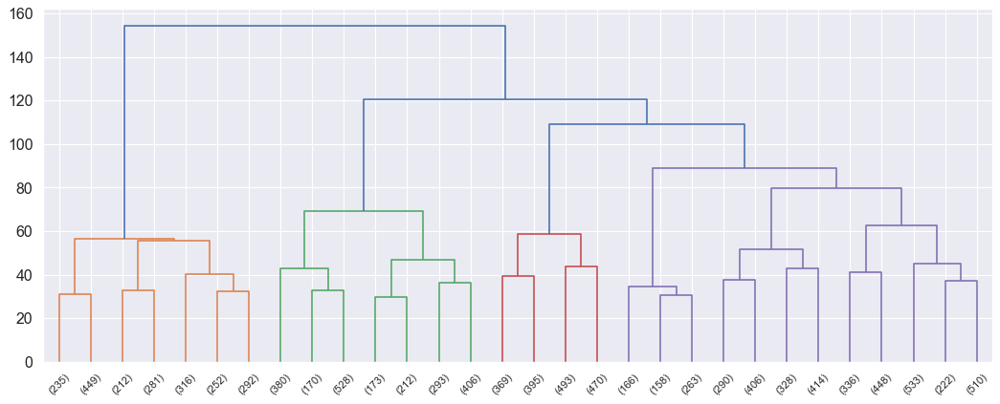

In [26]:
scaler = StandardScaler()

df_standard = scaler.fit_transform(df_to_std)
linked = linkage(df_standard, method = 'ward')

plt.figure(figsize=(16, 6), dpi=80)  
dendrogram(linked, truncate_mode='lastp', show_leaf_counts=True)
plt.show() 

Разделим клиентов на 4 кластера.

In [27]:
model_km = KMeans(n_clusters=4, random_state=99)
clusters = model_km.fit_predict(df_standard)
df['cluster_label'] = clusters

In [28]:
clusters_agg = df.groupby(['cluster_label', 'products_c'], as_index=False).agg({'id': 'count'})

clusters_agg['global_part'] = clusters_agg['id'] / len(df)
clusters_agg['local_part'] = (clusters_agg['id'] /
                              pd.Series([len(df[df['cluster_label'] == i])
                                         for i in clusters_agg['cluster_label']]))

clusters_agg = (clusters_agg.merge(df.groupby(['cluster_label', 'products_c'],
                                              as_index=False).agg({'age': 'mean', 'salary': 'median',
                                                 'balance': 'median', 'objects': 'mean',
                                                 'card': 'mean', 'loyalty': 'mean',
                                                 'churn': 'mean'}), on=['cluster_label', 'products_c'])
                .merge(df.join(pd.get_dummies(df['city']))
                       .groupby(['cluster_label', 'products_c'],
                                as_index=False)
                       .agg({'Ростов Великий': 'sum', 'Рыбинск': 'sum', 'Ярославль': 'sum'}),
                       on=['cluster_label', 'products_c']))

clusters_agg['cluster_label'] = 'Кластер ' + (clusters_agg['cluster_label']).astype('str')
clusters_agg['products_c'] = ['2+ продуктов' if i == 2 else '1 продукт' for i in clusters_agg['products_c']]
clusters_agg.columns = ["кластер", "груп. продуктов", "клиентов в группе", "доля общ.",
                        "доля в кластере", "возраст", "доход сред.", "баланс сред.", "объектов сред.", "кред. карты",
                       "активные клиенты", "отток (ушли)", "Ростов Великий", "Рыбинск", "Ярославль"]

display(clusters_agg.style
        .format('{:.0%}', subset=['доля общ.', 'доля в кластере',
                                  'кред. карты', 'активные клиенты', 'отток (ушли)'])
        .format('{:.0f}', subset=['возраст', 'доход сред.', 'баланс сред.',
                                  'объектов сред.', 'Ростов Великий', 'Рыбинск', 'Ярославль'])
        .background_gradient(sns.color_palette("light:#88a2df", as_cmap=True))
       )

,кластер,груп. продуктов,клиентов в группе,доля общ.,доля в кластере,возраст,доход сред.,баланс сред.,объектов сред.,кред. карты,активные клиенты,отток (ушли),Ростов Великий,Рыбинск,Ярославль
0,Кластер 0,2+ продуктов,3053,31%,100%,37,99654,108699,5,70%,54%,1%,0,890,2163
1,Кластер 1,1 продукт,771,8%,40%,37,104254,120728,5,71%,55%,0%,771,0,0
2,Кластер 1,2+ продуктов,1148,11%,60%,37,103566,121562,5,72%,56%,0%,927,221,0
3,Кластер 2,1 продукт,2904,29%,96%,38,95989,119267,5,70%,57%,0%,0,954,1950
4,Кластер 2,2+ продуктов,115,1%,4%,38,93836,160566,4,76%,62%,0%,0,0,115
5,Кластер 3,1 продукт,1409,14%,70%,45,101109,120393,5,70%,34%,100%,578,267,564
6,Кластер 3,2+ продуктов,600,6%,30%,45,103918,118337,5,69%,38%,100%,233,145,222


Так как признак 'количество потребляемых продуктов банка' это целевой признак исследования, сводную таблицу по результатам кластеризации мы сделали сразу с разделением на количество продуктов.  
- **Кластер 0 (3053 чел. 31%):**    
Все используют 2 и более продуктов. Средний доход ~99,5 тыс. Самый низкий, в среднем, баланс счёта ( ~108.5 тыс). Более половины - активные клиенты. Большинство проживает в Ярославле, а также Рыбинске.    
- **Кластер 1 (1919 чел. 19%):**    
В кластере 40% пользователей одного продукта и 60% - двух и более продуктов. Самый высокий, в среднем, доход ( ~104 тыс). В основном, проживают в Ростове Великом (где, согласно наблюдениям выше - также самый высокий, в среднем доход, ) и Рыбинске.    
- **Кластер 2 (3019 чел. 30%):**   
Крупный кластер, как и кластер под номером 0. Почти полностью состоит из пользователей одного продукта. Клиентов в этом кластере отличает низкий доход: ~95 тыс. для группы 1 продукт и ~94 тыс для группы 2+ продуктов. Также в группе, которая пользуется 2 продуктми, самый высокий баланс счёта и, в среднем, меньше объектов в собственности. Однако, важно иметь в виду, что в данной группе всего 115 человек.   
- **Кластер 3 (2009 чел. 20%):**   
Модель кластеризации целиком сформировала данный кластер из людей, которые ушли в отток. До этого они в среднем были наименее лояльны/активны. Большинство (70%) пользовались одной услугой банка, 30% пользовались двумя и более. Средний возраст в этом кластере значительно выше, чем в других - 45 лет. Средний доход ~120 тыс. у тех, кто пользовался 1 продуктом и ~118 тыс у тех, кто пользовался 2+ продуктами.    

В результате данного исследования мы выделили характерные черты самых значительных групп пользователей, в том числе тех, кто вышел из числа клиентов банка, тех кто использует больше одного продукта и др.    

Ещё раз в краткой форме осмотрим черты кластеров:      
- **Кластер 0:**  
    - большая группа, 2 продукта, средний доход, низкий баланс   
- **Кластер 1:**  
    - малая группа, высокий доход, высокий баланс  
- **Кластер 2:**   
    - большая группа, 1 продукт, низкий доход   
- **Кластер 3:**   
    - малая группа, отток, большой возраст, средний доход   



Изучить подгруппы клиентов можно на интерактивной карте признаков (*при наведении курсора появляется информация об индивидуальных характеристиках пользователей*).    
<span style="color:gray"><i>Исполнение этого пункта может занять некоторое время.</i></span>

In [29]:
tsne = TSNE(random_state=99, learning_rate=100)
tsne_representation = tsne.fit_transform(df_standard)

In [30]:
clusters_hover = df[['score', 'products',
                     'churn', 'loyalty', 'card', 'objects',
                     'salary', 'balance', 'age', 'gender',
                     'city']].astype('str')

fig = go.Figure()

fig = px.scatter(x=tsne_representation[:, 0], y=tsne_representation[:, 1], size=df['salary'],
                 color=df['products'], opacity=.2)

fig.update_traces(hovertemplate="%{text}", text=
                  "<b>Количество продуктов:    " +
                  clusters_hover['products'] + '       </b><br><br>' +
                  "Отток: " + clusters_hover['churn'] + '<br>' +
                  "Активность: " + clusters_hover['loyalty'] + '<br>' +
                  "Кред. карта: " + clusters_hover['card'] + '<br>' +
                  "Объектов в собственности: " +
                  clusters_hover['objects'] + '<br>' +
                  "Кредитный рейтинг: "+ clusters_hover['score'] +'<br><br>' +
                  "Доход: " + clusters_hover['salary'] + '<br>' +
                  "Баланс: " + clusters_hover['balance'] + '<br><br>' +
                  "Возраст: " + clusters_hover['age'] + '<br>' +
                  "Пол: " + clusters_hover['gender'] + '<br>' +
                  "Город: " + clusters_hover['city'])

fig.add_annotation(xref="paper", yref="paper",
    x=0.9, y=0.95,
    text="size:           доход<br>color:    продукты",
                   showarrow=False,
                   font=dict(family="arial",
                             size=16))
fig.update_layout(height=900,
                  width=900,
                  coloraxis_showscale=False,
                  title={'text': "РАСПРЕДЕЛЕНИЕ ПРИЗНАКОВ", 'y':1, 'x':0.525},
                  font=dict(family="Arial"),
                  template='plotly_white',
                  legend=dict(orientation='h', yanchor="bottom", y=0,
                              xanchor="center", x=0.45,
                              title_text='Количество используемых продуктов:'),
                  margin = dict(t=30, l=0, r=0, b=0))

fig.show()

- [В начало раздела](#c)     
- [К оглавлению](#0)   

## Статистический анализ<a id="d"></a>

#### Доход<a id="d1"></a>
Проверим гипотезу о различии дохода между теми клиентами, которые пользуются двумя продуктами банка, и теми, которые пользуются одним продуктом.  
Чтобы выбрать критерий оценки, нет необходимости проводить тест  Шапиро-Уилка на нормальность. То, что данные о доходе не имеют нормального распределения видно на графиках.

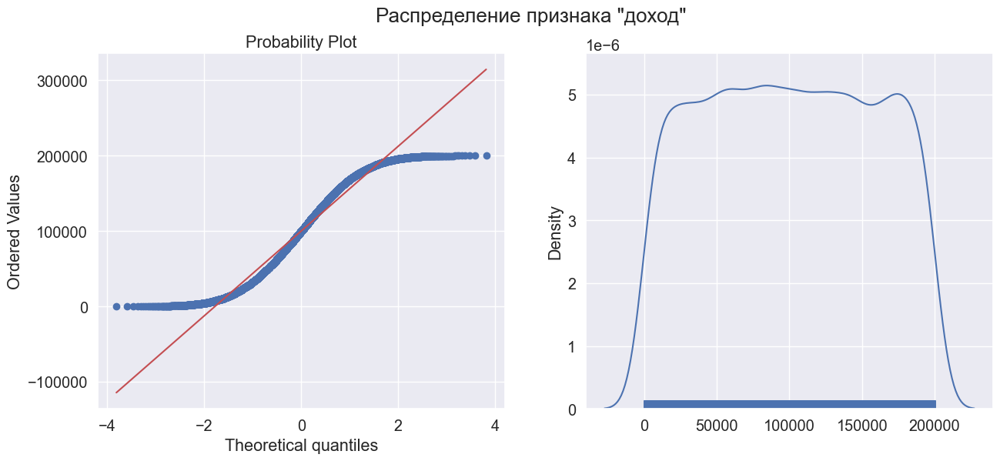

In [31]:
def distplot_funct(data, title=''):
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle(title)

    sns.distplot(ax=axes[1], x=data, rug=True, hist=False)
    stats.probplot(data, dist=stats.norm, plot=axes[0])

    plt.show()
    
distplot_funct(df['salary'], title='Распределение признака "доход"')

Для проверки гипотезы о различии в доходе клиентов используем непараметрический критерий Манна-Уитни.    
- Согласно нулевой гипотезе **𝐻₀** средние доходы в группах, которые пользуются одним продуктом и двумя+ продуктами - равны.   
- Согласно альтернативной гипотезе **𝐻₁** средние доходы в этих группах различаются.    
- Критерий статистический значимости **𝛼** зададим равным 0,05.   

Указанную гипотезу проверим на двух наборах групп: в первой те, кто получает одну и строго две услуги (как сказано в запросе менеджмента). Во второй - те, кто получает одну и более двух услуг.   
Так как фактически будет проведено два теста, используем поправку Бонферони на множественное тестирование. 

In [32]:
alpha = .05
alpha_corrected = alpha / 2
x1 = df[df['products'] == 1]['salary'].tolist()
y1 = df[df['products'] == 2]['salary'].tolist()

def mannwtest(x, y):
    result = mannwhitneyu(x, y, alternative='two-sided')
    print(result)
    print()
    if result[1] > alpha_corrected:
        print('Гипотеза Н0 не отвергается. Группы не имеют статистического различия.')
    else:
        print('Гипотеза Н0 отвергается. Группы статистически различаются.')        

Итак, согласно заданным выше условиям, проверим есть ли различия в доходе между теми, кто пользуется **одной** услугой банка и теми, кто пользуется **двумя** услугами.

In [33]:
print(f"В группе с 1 используемым продуктом средний доход равен {df[df['products_c'] == 1]['salary'].mean():.0f} ₽")
print(f"В группе с 2 и более используемыми продуктами средний доход равен {df[df['products_c'] == 2]['salary'].mean():.0f} ₽")
print()
print()

mannwtest(x1, y1)

В группе с 1 используемым продуктом средний доход равен 99487 ₽
В группе с 2 и более используемыми продуктами средний доход равен 100714 ₽


MannwhitneyuResult(statistic=11554276.0, pvalue=0.4079566651927651)

Гипотеза Н0 не отвергается. Группы не имеют статистического различия.


Аналогичным образом проверим, есть ли различия в доходе между теми, кто пользуется **одной** услугой и теми, кто пользуется **двумя и более** услугами. 

In [34]:
for i in [1, 2]:
    print(f"В группе с количеством используемых продуктов {i} средний доход равен {df[df['products'] == i]['salary'].mean():.0f} ₽")

В группе с количеством используемых продуктов 1 средний доход равен 99487 ₽
В группе с количеством используемых продуктов 2 средний доход равен 100452 ₽


In [35]:
for i in [1, 2]:
    print(f"В группе с количеством используемых продуктов {i} средний доход равен {df[df['products'] == i]['salary'].mean():.0f} ₽")
print()
print()

x2 = x1
y2 = df[df['products'] > 1]['salary'].tolist()
mannwtest(x2, y2)

В группе с количеством используемых продуктов 1 средний доход равен 99487 ₽
В группе с количеством используемых продуктов 2 средний доход равен 100452 ₽


MannwhitneyuResult(statistic=12342198.0, pvalue=0.2850986972637064)

Гипотеза Н0 не отвергается. Группы не имеют статистического различия.


В обоих случаях анализ не подтвердил наличия статистически значимого различия в доходах между теми, кто пользуется одним и несколькими продуктом банка.

#### Возраст<a id="d2"></a>
В рамках исследовательского анализа мы обнаружили, что среди людей старшего возраста (~ от 40 и выше) - тех кто пользуется только одной услугой больше, чем тех, кто использует две и больше. И напротив, среди клиентов более молодого возраста - потребителей двух продуктов больше, нежели потребителей одного. Иначе говоря, средний возраст в этих группах различается.     

Для данного исследования проведём дополнительную подготовку - уберём выбросы. Их не много.

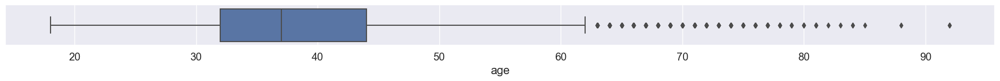

In [36]:
fig = plt.figure(figsize=(24, 1))
sns.boxplot(x=df["age"])
plt.show()

In [37]:
age_cut = df['age']
age_threshold = age_cut.describe()[6] + ((age_cut.describe()[6] - age_cut.describe()[4]) * 1.5)
age_test_data = df[df['age'] <= age_threshold][['products_c', 'age']]
md(f"В рамках исследования убрано <b>{len(df) - len(age_test_data)}</b> выбросов. Это <b>{(len(df) - len(age_test_data)) / len(df):.1%}</b> данных.<br>"
   f"В выборках, разделённых по признаку потребления продуктов "
   f"<b>{len(age_test_data.query('products_c == 1'))} и {len(age_test_data.query('products_c == 2'))}</b> клиентов соответственно.<br>"
   f"Максимальный возраст после предобработки - <b>{age_test_data['age'].max()}</b> года.<br><br>"
   f"Средний возраст клиентов, использующих одну услугу: <b>{age_test_data[age_test_data['products_c'] == 1]['age'].mean():.1f}</b> лет<br>"
   f"Средний возраст клиентов, использующих две и более услуг: <b>{age_test_data[age_test_data['products_c'] > 1]['age'].mean():.1f}</b> лет")

В рамках исследования убрано <b>359</b> выбросов. Это <b>3.6%</b> данных.<br>В выборках, разделённых по признаку потребления продуктов <b>4893 и 4748</b> клиентов соответственно.<br>Максимальный возраст после предобработки - <b>62</b> года.<br><br>Средний возраст клиентов, использующих одну услугу: <b>38.5</b> лет<br>Средний возраст клиентов, использующих две и более услуг: <b>37.0</b> лет

Проверим, является ли данное различие статистически значимым.   
Перед формулированием условий теста проведём трансформацию данных о возрасте.

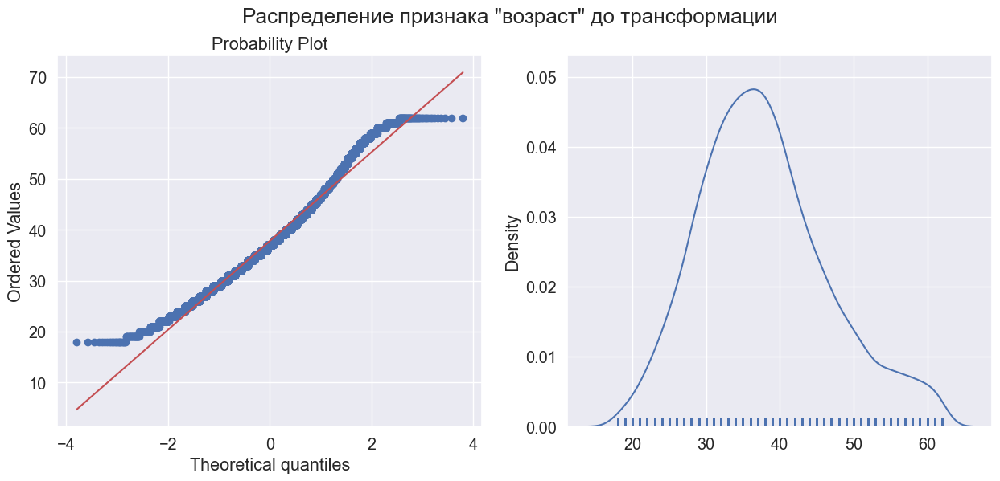

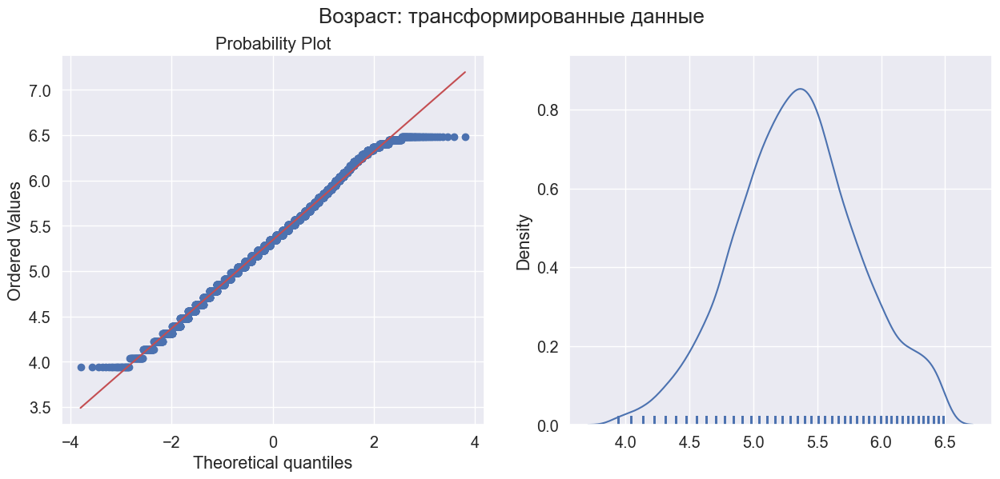

In [38]:
distplot_funct(age_test_data['age'], title='Распределение признака "возраст" до трансформации')
               
age_test_box_norm = stats.boxcox(age_test_data['age'])[0]
distplot_funct(age_test_box_norm, title='Возраст: трансформированные данные')

Данные гомогенны и теперь их распределение близко к нормальному. Это позволяет использовать t-критерий Стьюдента для проверки различия между средними возрастами.    
В данном тесте:   
- Порог статистический значимости **𝛼** зададим как 0,05.   
- Согласно нулевой гипотезе **𝐻₀** средний возраст в группах, которые пользуются одним продуктом и двумя или более продуктами - равны.
- Согласно альтернативной гипотезе **𝐻₁** средний возраст в этих группах различается.

In [39]:
age_test_data['age_transformed'] = age_test_box_norm
x3 = age_test_data[age_test_data['products_c'] == 1]['age_transformed'].tolist()
y3 = age_test_data[age_test_data['products_c'] > 1]['age_transformed'].tolist()

st_results = stats.ttest_ind(x3, y3, alternative='two-sided')

print(st_results)
print()
if st_results[1] > alpha:
    print('Гипотеза Н0 не отвергается. Группы не имеют статистического различия.')
else:
    print('Гипотеза Н0 отвергается. Группы статистически различаются.') 

Ttest_indResult(statistic=8.014549281601484, pvalue=1.2337481643896231e-15)

Гипотеза Н0 отвергается. Группы статистически различаются.


Гипотеза о равенстве среднего возраста в исследованных группах не получила статистического подтверждения. Это даёт основания утверждать, что средний возраст в группе, пользующейся одной услугой и группе, пользующейся двумя и более услугами - различается.

#### Отток<a id="d3"></a>

Также в ходе исследовательского анализа мы обнаружили, что в группах с потреблением одного продукта и потреблением двух и более продуктов - значительно различается процент клиентов, прекративших пользование услугами банка. Так как мы будем сравнивать доли оттока, лучшим образом подойдёт тест гипотезы о равенстве долей.   

В данном исследовании:
- Порог статистический значимости **𝛼** = 0,05.   
- Согласно нулевой гипотезе **𝐻₀** доли клиентов, ушедших в отток равны в группах, пользующихся 1 и 2+ продуктами.
- Согласно альтернативной гипотезе **𝐻₁** доли оттока в данных группах различаются.

In [40]:
zx1 = df[df['products_c'] == 1]['churn'].sum()
zx2 = df[df['products_c'] > 1]['churn'].sum()
zy1 = len(df[df['products_c'] == 1])
zy2 = len(df[df['products_c'] > 1])

p1 = zx1 / zy1
p2 = zx2 / zy2

p_combined = (zx1 + zx2) / (zy1 + zy2)
difference = p1 - p2 

z_value = difference / np.sqrt(p_combined * (1 - p_combined) * (1 / zy1 + 1 / zy2))
distr = stats.norm(0, 1)

p_value = (1 - distr.cdf(abs(z_value))) * 2

print(f'Отток в группе с 1 продуктом: {p1:.1%}')
print(f'Отток в группе с 2+ продуктами: {p2:.1%}')
print()
print(f'p_value = {p_value}')

if p_value > alpha:
    print('Гипотеза Н0 не отвергается. Группы не имеют статистического различия.')
else:
    print('Гипотеза Н0 отвергается. Группы статистически различаются.') 

Отток в группе с 1 продуктом: 27.7%
Отток в группе с 2+ продуктами: 12.8%

p_value = 0.0
Гипотеза Н0 отвергается. Группы статистически различаются.


Гипотеза о равенстве долей оттока не нашла подтверждения. Это даёт основания утверждать, что разница в оттоке статистически значима. В группе, которая использовала только один продукт процент клиентов, прекративших пользоваться услугами, выше, чем в группе, использовавшей два и более продуктов.    



- [В начало раздела](#d)     
- [К оглавлению](#0)   

## Выводы<a id="e"></a>
Данное исследование охватило 10 тысяч клиентов Метанпромбанка. Целевой метрикой было количество услуг, которыми пользуются клиенты.   

Из них:
- 5084 используют 1 услугу  
- 4590 используют 2 услуги  
- 266 используют 3 услуги   
- 60 используют 4 услуги    

Так как группы с большим количеством услуг малочисленны, мы объединили их в единую группу с теми, кто потребляет 2 продукта, таким образом, что получились две категории: пользователи одного продукта (**5084** чел.) и пользователи 2 и более продуктов (**4916** чел.). 

В рамках анализа мы изучили, как количество потребляемых услуг банка взаимосвязано с доходами клиентов, их возрастом, лояльностью и активностью использованияя продуктов, оттоком, балансом счетов, а также местами проживания.

### Доходы<a id="e1"></a>
В целом средний доход по всей совокупности клиентов, объединённых данным исследованием составляет **100 090 ₽**.  Максимальный доход составляет **199 992** рубля, минимальный **11** ₽. Важно учитывать, что как крайне малые так и любые другие числа в данных о доходе нельзя считать абсолютно достоверными, так как клиент мог не указать часть доходов, указал доходы в месяц обращения, когда фактически доходов не имел. Кроме того, данные могли устареть.    

Мы установили, что средний доход в группе, использующей 1 продукт равен **99 487 рублям**.   
В группе, использующей 2 продукта - **100 452** рубля.    
В группе, которая использует 3 продукта **104 318** рублей, и **104 763** рубля в группе, которая пользуется 4 продуктами.   


Доход у тех, кто пользуется 2 и более продуктами в среднем выше, чем у тех, кто пользуется одним. За исключением клиентов ранне-среднего возраста; такие люди чаще приобретают жильё и автомобили, в том числе в кредит. Их доход может быть указан за вычетом кредитной нагрузки. Ещё одна причина: это активный возраст, когда многие клиенты развивают собственный бизнес, и могут вкладывать в него часть средств, что также снижает доходы.

Также мы провели стат-тесты различий, и установили, что статистически-значимой разницы в доходе нет ни при строгом сравнении групп, потребляющих один и два продукта (как указано в запросе менеджмента), ни при сравнении групп, пользующихся одной, а также двумя и более услугами.    

Кроме вышеописанного обращает на себя внимание равномерное распределение показателей дохода. Другими словами, клиентов в разных категориях дохода (от самого малого до самого высокого) примерно одинаковое количество, что крайне нехарактерно для этого показателя. В других исследованиях, которые касаются дохода, часто не сложно выделить условный средний доход, который получает большинство участников выборки, а также малый и большой доход, который получает меньшинство.    
Считаем, что по итогам данного анализа необходимо уточнить качество источника данных о доходах клиентов.

### Возраст<a id="e2"></a>
Среди клиентов Метанпромбанка представлены все возрастные категории от **18** до **92** лет. Большую часть клиентуры составляют люди в возрасте от **28** до **49** лет.   
Также, мы провели возрастную категоризацию клиентов, получив 4 группы.    

В возрасте от 18 до 30 лет - **1984** клиента,   
От 31 до 40 лет - **4451** клиент,  
От 41 до 50 лет - **2320** клиентов  
И свыше 50 лет - **1261** клиент. 

До 40 лет количество тех, кто пользуется двумя и более услугами в среднем выше. Начиная с 40-летнего возраста напротив превалируют клиенты, которые пользуются только одной услугой банка. Таким образом, средний возраст тех, кто использует 2+ услуг ниже и составляет **37** лет, против **38,5** лет у тех, кто пользуется 1 услугой банка.   
Статистическая значимость данного различия подтверждена стат-тестом. 

### Активность<a id="e3"></a>
Более половины клиентов помечены в базе как активные - в их числе **5151** чел.     
Вместе с тем, активность слабо связана с потребительскими группами. Согласно результатам исследовательского анализа, среди пользователей одного продукта лояльными считаются **50,4%** клиентов. Среди пользователей двух и более продуктов их доля составляет **52,6%**.

### Отток<a id="e4"></a>
Среди всех клиентов **20%** или **2037** человека попали в отток.   

Среди клиентов, которые пользовались 1 услугой, ушли **27.7%**   
Среди пользователей 2 услуг ушли **7.6%**   
Среди клиентов, использовавших 3 продукта, ушли **82.7%**    
И среди тех, кто использовал 4 продукта, ушли **все** 60 человек.    

Не смотря на высокие значения оттока среди пользователей 3 и 4 продуктов, в целом в группе пользования двумя и более услугами отток ниже, чем в группе по одному продукту (**12.8%** против **27.7%**). Статистическая значимость этой разницы была подтверждена стат-тестом.

### Город<a id="e5"></a>
В Ярославле живёт б**о**льшая часть клиентов - **5014** человек   
В Рыбинске проживают **2477** человек  
В Ростове Великом живёт **2509** клиентов  

При этом, в Ярославле затруднительно выделить группу, которая лидировала бы по количеству потребляемых продуктов. Одной, а также двумя и более услугами пользуется примерно одинаковое количество клиентов. В Рыбинске незначительно больше тех, кто использует две услуги (**50,7%** против **49,3%**). А в Ростове Великом тех, кто пользуется 1 продуктом **53,8%**, против **46,2%** пользователей 2+ продуктов.   

При этом, средний доход в Ростове и Ярославле выше в группе, использующей 2+ продуктов. В Рыбинске напротив, доход в среднем выше в группе потребителей одного продукта.

### Баланс<a id="e6"></a>
Баланс счёта, в среднем, у клиентов в группах потребления 1 и 2+ продуктов не различается. Однако, важно учесть, что более половины (**55%**) пользователей двух и более продуктов вообще не имеют сведений о балансе. Для группы с одним продуктом этот показатель составляет **18%**.    

Для того, чтобы достоверно судить о причинах отстутствия части данных о балансе у нас недостаточно данных. Одн из предположений касается того, что у данных клиентов действительно **нет баланса**, так как они пользуются лишь услугами, не предполагающими его наличие. Например, выплачивают через банк кредит, или пользуются банковской ячейкой. 

### Другие признаки<a id="e7"></a>
У клиентов, использующих 1 а также 2+ продуктов - в среднем одинаковый кредитный рейтинг. Его медиана составляет около 650. Однако, есть значительная группа клиентов с максимальным кредитным рейтингом. Учитывая, что Метанпромбанк - отраслевая кредитная организация, мы предполагаем, что это могут быть привилегированные клиенты, а также представители менеджмента банка или предприятий-партнёров.    


Кредитными картами обладают около 70% клиентов. Доля пользователей данным продуктом среди пользователей одного продукта и двух и более продуктов - одинакова.    

По количеству объектов в собственности во всех категориях либо нет различий, либо превалирует группа, использующая один продукт. Исключение - лишь владельцы двух объектов, которые чаще пользуются двумя и более услугами банка.    

Мужчин среди клиентов больше чем женщин. При этом, среди мужчин большинство пользуется одним продуктом, среди женщин разницы практически нет.   

    Данное исследование проводилось в разрезе целевой метрики количества потребляемых услуг. Возможно, дополнительно сегментировать клиентов можно было бы с помощью кросс-анализа других признаков, однако это выходит за рамки текущего исследования.

### Модельные группы клиентов<a id="e8"></a>

С помощью алгоритма машинного обучения мы разделили клиентов по модели потребления на 4 кластера. 

**Кластер # 0:**   
Пользователи <span style="color:green"><b>двух и более</b></span>. продуктов, <span style="color:orange"><b> средний</b></span> размер дохода (**~99,5 тыс**), самый <span style="color:red"><b> низкий</b></span> в среднем баланс, <span style="color:green"><b> высокая</b></span> лояльность. 

**Кластер # 1:**  
В кластере <span style="color:orange"><b>40% </b></span> пользователей одного продукта и <span style="color:orange"><b> 60%</b></span> - двух и более продуктов. <span style="color:green"><b> Высокий</b></span> баланс счёта и самый <span style="color:green"><b>высокий </b></span>, в среднем, доход ( **~104 тыс**).

**Кластер # 2:**  
В данном кластере в основном пользователи <span style="color:red"><b> одного продукта</b></span>. <span style="color:red"><b>Низкий  </b></span>доход (**~95** тыс. для группы 1 продукт и **~94** тыс для группы 2+ продуктов)

**Кластер # 3:**  
Усреднённая группа<span style="color:red"><b> оттока</b></span>  - в ней все, кто перестал пользоваться услугами банка. Большинство (**70%**) пользовались <span style="color:red"><b> одной</b></span> услугой банка, **30%** пользовались <span style="color:orange"><b> двумя и более</b></span>. Средний возраст около 45 лет. Доход, в среднем, на <span style="color:green"><b> высоком</b></span> уровне (**~120 тыс** у тех, кто пользовался 1 продуктом, **~118** тыс у тех, кто пользовался 2+ продуктами).      


- [В начало раздела](#e)     
- [К оглавлению](#0)   

## Рекомендации<a id="f"></a>

Клиенты, которые пользуются двумя услугами банка в целом демонстрируют большую лояльность, и реже уходят в отток. Работу с такими клиентами можно принять за модель по повышению вовлечённости других групп.     
В том числе внимания требует категория лиц средне-старшего и старшего возраста, которые пользуются меньшим количеством услуг, чаще одной. И чаще уходят в отток. Со стороны продуктовой группы банка может быть разработан целевой план повышения лояльности и активности потребления услуг среди клиентов старшего возраста.    


Особого внимания требуют группы, потребляющие 3 и 4 услуги. Они крайне малочисленны, что тоже показательно, и большинство клиентов (в группе 4 продуктов - все) ушли в отток. Само по себе это ещё не говорит о системных проблемах; возможно они пользовались "архивными" услугами, которые банк больше не оказывает. Однако, необходимо понять причины, и в случае выявления недостатков и получения экономического обоснования - разработать программу расширения аудитории пользования 3 и более услугами.    

Также внимания требует ситуация в Ростове Великом. Беглый осмотр данных указывает, что там самый высокий средний баланс счёта и значительный отток (распределение признаков по городам, тема отдельного анализа, который возможно нужен, и возможно выявит и другие факторы). В сочетании с тем, что в Ростове меньше пользователей двух и более услуг, складывается ситуация, когда у людей есть сбережения, но они не могут ими эффективно распоряжаться. Возможно, ростовчанам стоило бы предложить дополнительные инвестиционные, сберегательные или страховые продукты. В меньшей степени это касается и остальных клиентов.   


Также, по итогам данного исследования мы сформируем несколько запросов к техническому персоналу банка, с целью уточнения механизма сбора данных о доходах клиентов (анализ данного признака выявил, что он имеет довольно необычное для данного показателя распределение); и причин отсутствия сведений о балансе многих клиентов.   


   
- [К оглавлению](#0)   


- [Дашборд](https://public.tableau.com/app/profile/evgeniy5413/viz/Methanprom/Dashboard1 "Tableau")
- [Презентация](https://drive.google.com/file/d/1H9LRih6Fz17KinIi4X8vHtXCjqV28Ga0/view?usp=sharing "Презентация")
----

![image info](https://i.postimg.cc/NMRz47Hc/Metanprom-1.jpg)